## Reading the data

In [1]:
import pandas as pd
import numpy as np
from gensim.models.doc2vec import Doc2Vec, TaggedDocument
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE


df = pd.read_csv("../../corpus_sprint3_balanced_cleaned_all.csv", encoding="utf-8")
df = df.dropna()
print(df)
print(df.shape)

model = Doc2Vec.load("../../model_doc2vec_balanced_20epochs")

        Row No Date received                  Product  \
446       6874      09/09/16              Payday loan   
713      10840      08/07/15            Consumer Loan   
803      12248      08/07/16            Consumer Loan   
1153     17162      05/26/16            Consumer Loan   
1185     17642      11/05/15            Consumer Loan   
...        ...           ...                      ...   
126588  222826      09/21/16  Bank account or service   
126589  142174      03/05/16  Bank account or service   
126590   55888      01/23/17  Bank account or service   
126591  293505      09/27/16  Bank account or service   
126592  327087      09/28/15  Bank account or service   

                       Sub-product                                     Issue  \
446                           None  Charged fees or interest I didn't expect   
713                   Vehicle loan       Problems when you are unable to pay   
803                   Vehicle loan                Managing the loan or leas

## One hot encoding and concatenating

In [2]:
vectors = model.docvecs.vectors_docs

In [3]:

one_hot = pd.Categorical(df['Issue'])
df_dummies = pd.get_dummies(one_hot)

one_hot2 = pd.Categorical(df['Sub-issue'])
df_dummies2 = pd.get_dummies(one_hot2)

v_df = pd.DataFrame(vectors)
df_concat = pd.concat([v_df, df_dummies, df_dummies2], axis = 1)
print(df_concat.shape)

(58035, 198)


## Applying T-SNE

In [4]:
tsne = TSNE(n_components=2)
data_reduced = tsne.fit_transform(df_concat)


In [5]:
print(data_reduced.shape)

(58035, 2)


## Applying k-means

In [6]:
from sklearn.cluster import KMeans
from sklearn import metrics

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49


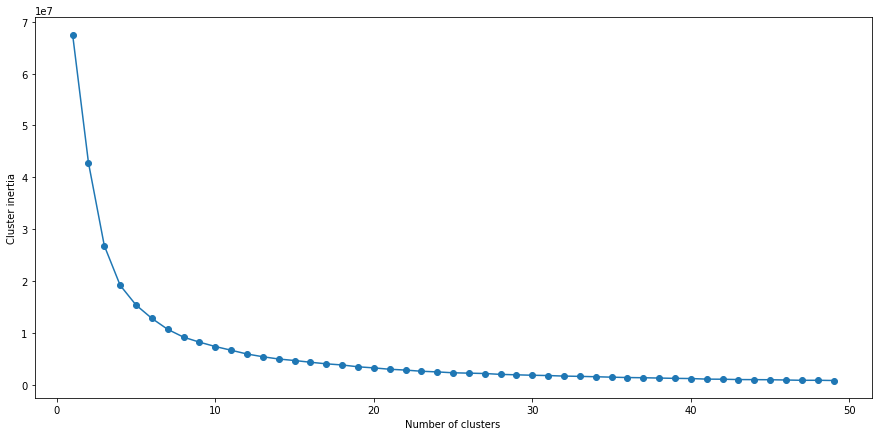

In [7]:
inertia = []
k_min=1
k_max=50
for i in range(k_min, k_max):
    print(i)
    km = KMeans(n_clusters=i,init='k-means++')
    km.fit(data_reduced)
    inertia.append(km.inertia_)
plt.rcParams['figure.figsize'] = [15,7]
plt.plot(range(k_min,k_max), inertia,marker='o')
plt.xlabel('Number of clusters')
plt.ylabel('Cluster inertia')
plt.show()

## Silhouette scores

For n_clusters = 4 The average silhouette_score is : 0.37593085
For n_clusters = 5 The average silhouette_score is : 0.36383784
For n_clusters = 6 The average silhouette_score is : 0.38359615
For n_clusters = 7 The average silhouette_score is : 0.38665295
For n_clusters = 8 The average silhouette_score is : 0.38498792
For n_clusters = 9 The average silhouette_score is : 0.38452923
For n_clusters = 10 The average silhouette_score is : 0.39717156
For n_clusters = 11 The average silhouette_score is : 0.40124077
For n_clusters = 12 The average silhouette_score is : 0.4060726
For n_clusters = 13 The average silhouette_score is : 0.41205278
For n_clusters = 14 The average silhouette_score is : 0.41568723
For n_clusters = 15 The average silhouette_score is : 0.42582235
For n_clusters = 16 The average silhouette_score is : 0.42993122
For n_clusters = 17 The average silhouette_score is : 0.43022102
For n_clusters = 18 The average silhouette_score is : 0.44395208
For n_clusters = 19 The average 

C:\Users\l-Larsovic-l\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


For n_clusters = 24 The average silhouette_score is : 0.4938138


C:\Users\l-Larsovic-l\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


For n_clusters = 25 The average silhouette_score is : 0.49223155


C:\Users\l-Larsovic-l\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


For n_clusters = 26 The average silhouette_score is : 0.5018486


C:\Users\l-Larsovic-l\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


For n_clusters = 27 The average silhouette_score is : 0.5070923


C:\Users\l-Larsovic-l\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


For n_clusters = 28 The average silhouette_score is : 0.5042277


C:\Users\l-Larsovic-l\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


For n_clusters = 29 The average silhouette_score is : 0.50830895


C:\Users\l-Larsovic-l\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


For n_clusters = 30 The average silhouette_score is : 0.50983936


C:\Users\l-Larsovic-l\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


For n_clusters = 31 The average silhouette_score is : 0.5146378


C:\Users\l-Larsovic-l\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


For n_clusters = 32 The average silhouette_score is : 0.5202443


C:\Users\l-Larsovic-l\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


For n_clusters = 33 The average silhouette_score is : 0.51055163


C:\Users\l-Larsovic-l\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


For n_clusters = 34 The average silhouette_score is : 0.51751745


C:\Users\l-Larsovic-l\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


For n_clusters = 35 The average silhouette_score is : 0.53090745


C:\Users\l-Larsovic-l\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


For n_clusters = 36 The average silhouette_score is : 0.53433484


C:\Users\l-Larsovic-l\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


For n_clusters = 37 The average silhouette_score is : 0.546902


C:\Users\l-Larsovic-l\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


For n_clusters = 38 The average silhouette_score is : 0.55053556


C:\Users\l-Larsovic-l\anaconda3\lib\site-packages\ipykernel_launcher.py:6: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


For n_clusters = 39 The average silhouette_score is : 0.537881


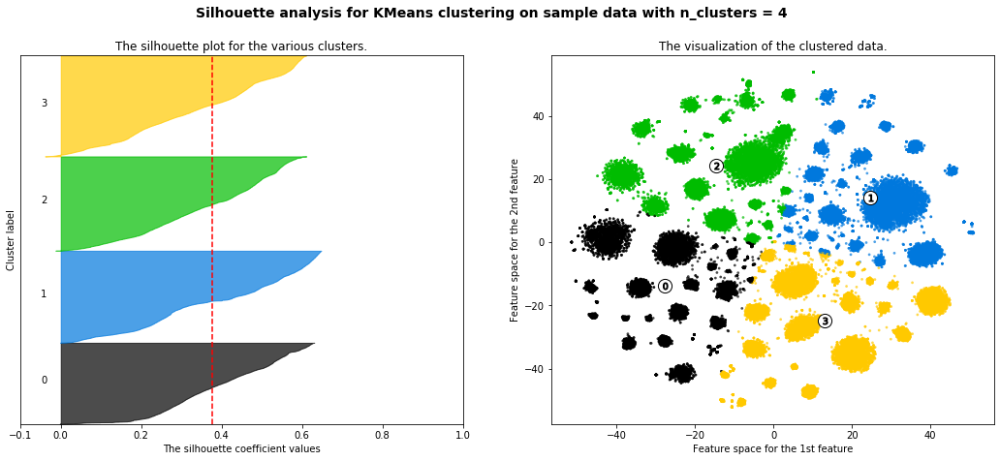

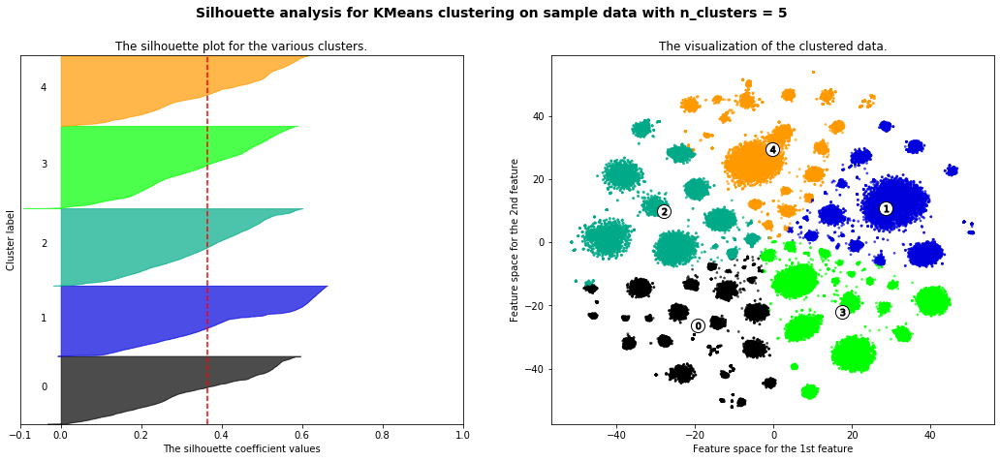

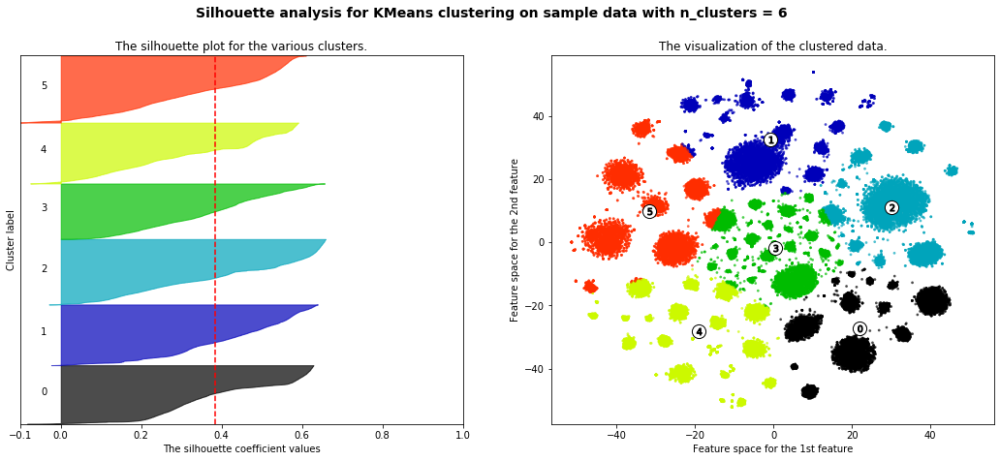

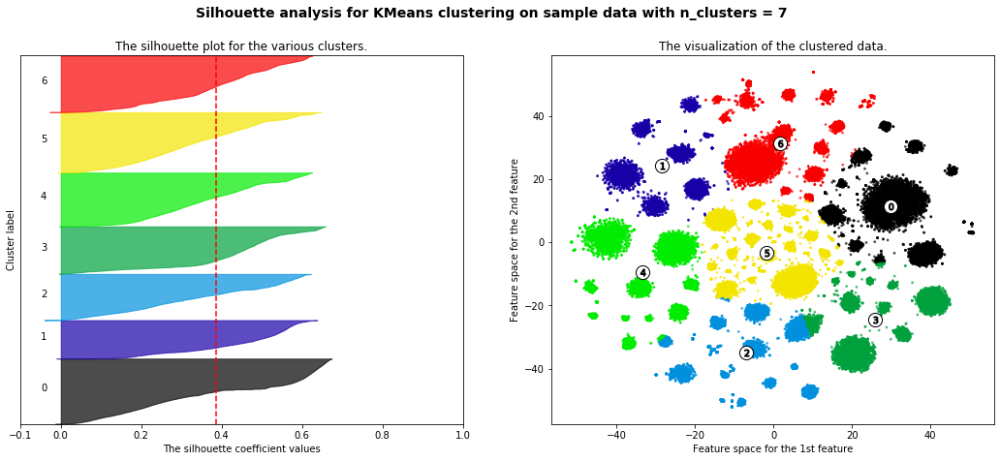

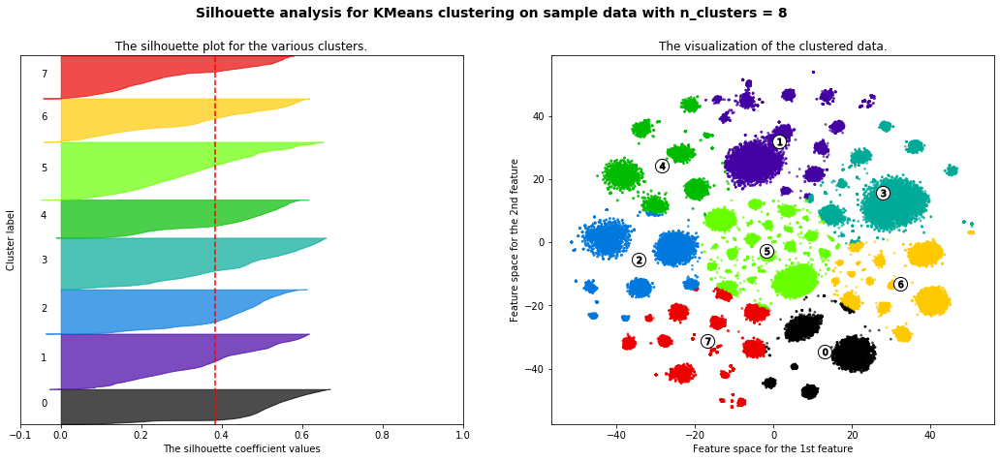

...

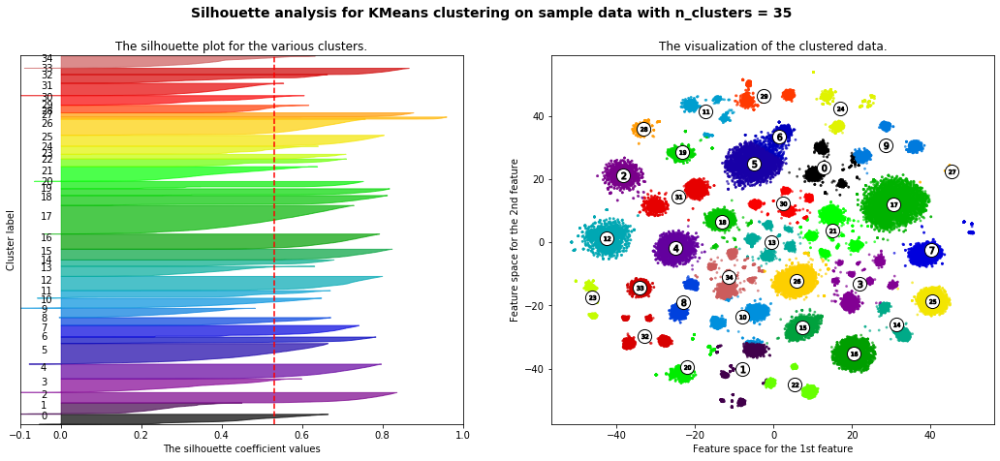

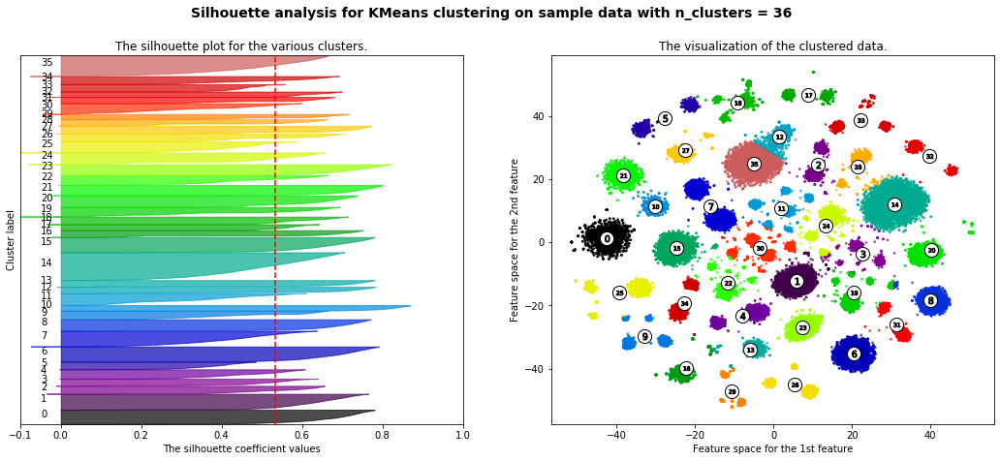

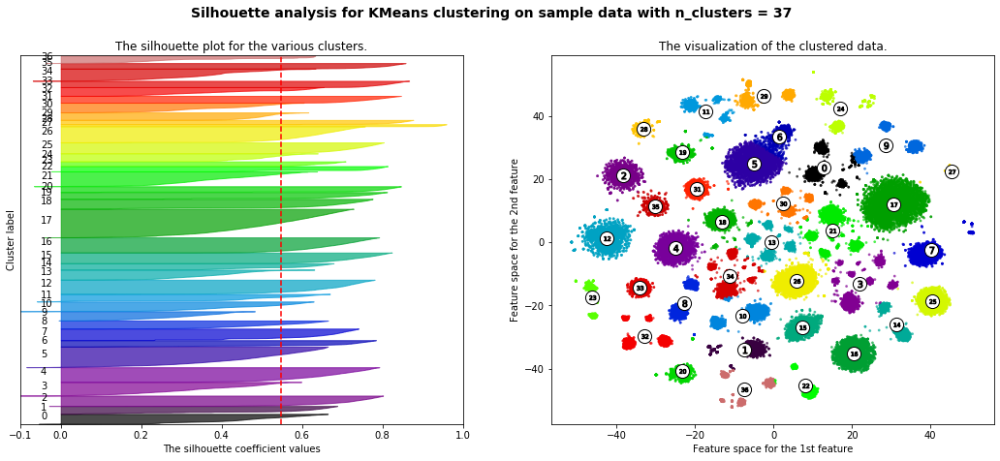

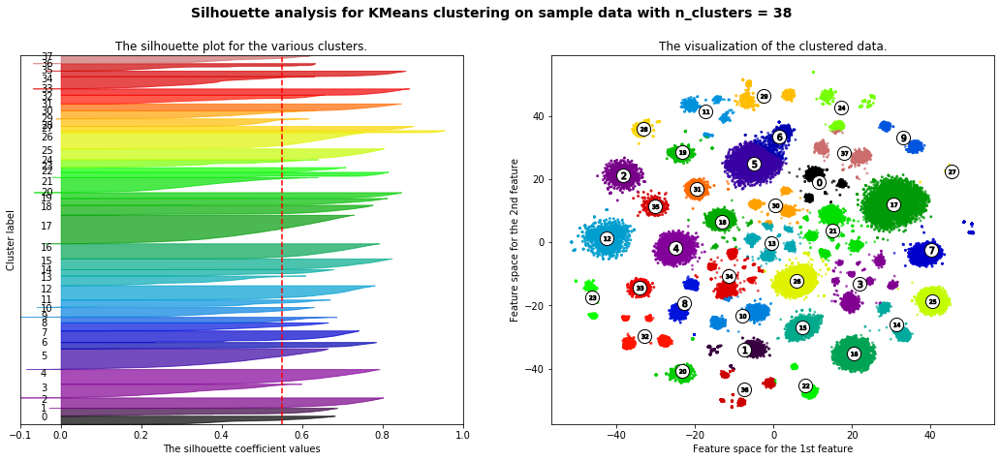

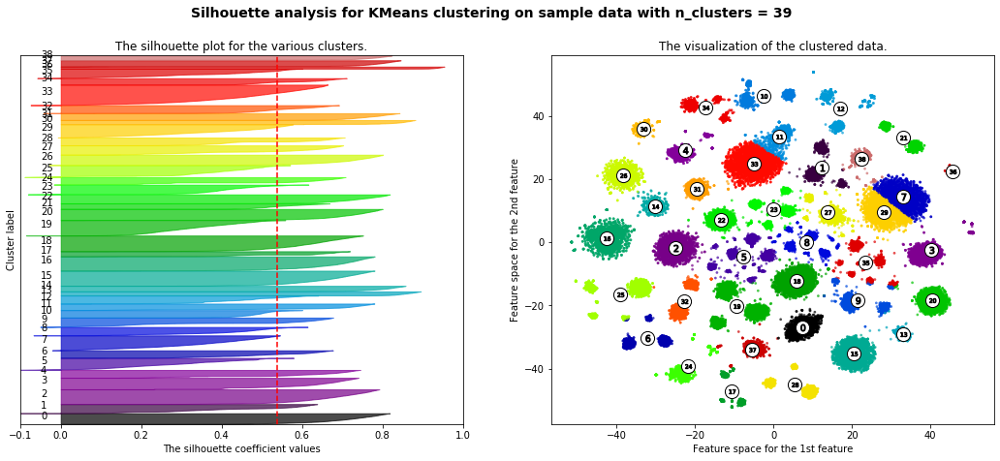

In [8]:
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.cm as cm

for n_clusters in range(4,40):
    # Create a subplot with 1 row and 2 columns
    fig, (ax1, ax2) = plt.subplots(1, 2)
    fig.set_size_inches(18, 7)

    # The 1st subplot is the silhouette plot
    ax1.set_xlim([-0.1, 1])
    # The (n_clusters+1)*10 is for inserting blank space between silhouette
    # plots of individual clusters, to demarcate them clearly.
    ax1.set_ylim([0, len(data_reduced) + (n_clusters + 1) * 10])

    # Initialize the clusterer with n_clusters value and a random generator
    # seed of 10 for reproducibility.
    clusterer = KMeans(n_clusters=n_clusters, random_state=10)
    cluster_labels = clusterer.fit_predict(data_reduced)

    # The silhouette_score gives the average value for all the samples.
    # This gives a perspective into the density and separation of the formed
    # clusters
    silhouette_avg = silhouette_score(data_reduced, cluster_labels)
    print("For n_clusters =", n_clusters,
          "The average silhouette_score is :", silhouette_avg)

    # Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(data_reduced, cluster_labels)

    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    # 2nd Plot showing the actual clusters formed
    colors = cm.nipy_spectral(cluster_labels.astype(float) / n_clusters)
    ax2.scatter(data_reduced[:, 0], data_reduced[:, 1], marker='.', s=30, lw=0, alpha=0.7,
                c=colors, edgecolor='k')

    # Labeling the clusters
    centers = clusterer.cluster_centers_
    # Draw white circles at cluster centers
    ax2.scatter(centers[:, 0], centers[:, 1], marker='o',
                c="white", alpha=1, s=200, edgecolor='k')

    for i, c in enumerate(centers):
        ax2.scatter(c[0], c[1], marker='$%d$' % i, alpha=1,
                    s=50, edgecolor='k')

    ax2.set_title("The visualization of the clustered data.")
    ax2.set_xlabel("Feature space for the 1st feature")
    ax2.set_ylabel("Feature space for the 2nd feature")

    plt.suptitle(("Silhouette analysis for KMeans clustering on sample data "
                  "with n_clusters = %d" % n_clusters),
                 fontsize=14, fontweight='bold')

plt.show()

## Analyzing with narrative

In [11]:
number_clusters = 38
km = KMeans(n_clusters=number_clusters,init='k-means++')
indexes = km.fit_predict(data_reduced)
centroids = km.cluster_centers_

df_index = pd.DataFrame(indexes)

indici = []
for i in range(0,len(indexes)):
    indici.append(i)
df1 = df_index.set_index(pd.Index(indici))
df2 = df.set_index(pd.Index(indici))
df_result = pd.concat([df1,df2], axis = 1)
print(df_result)

        0  Row No Date received                  Product  \
0       8    6874      09/09/16              Payday loan   
1      20   10840      08/07/15            Consumer Loan   
2      26   12248      08/07/16            Consumer Loan   
3      26   17162      05/26/16            Consumer Loan   
4      26   17642      11/05/15            Consumer Loan   
...    ..     ...           ...                      ...   
58030   6  222826      09/21/16  Bank account or service   
58031  29  142174      03/05/16  Bank account or service   
58032   6   55888      01/23/17  Bank account or service   
58033  15  293505      09/27/16  Bank account or service   
58034   6  327087      09/28/15  Bank account or service   

                      Sub-product                                     Issue  \
0                            None  Charged fees or interest I didn't expect   
1                    Vehicle loan       Problems when you are unable to pay   
2                    Vehicle loan         

Cluster number: 0
i m applying for a home loan and just found out there a negative posted on my credit report the creditor is the in texas i ve shared an apartment there in the past when i moved to california in i ve ensured with the apartment that there is not what soever balance in my name and asked them to remove my name off the apartment now i found out that they have posted a balance over against my credit report 

this debt was in bankruptcy per and they both show this to be balance and filed in bkruptcy equifax does not put in a dispute on with equifax and then again to check on in and then again to check in on the girl said said to send in documentation and will be resolved within hours i did send it in on showing the bankruptcy papers and today i called in and no one would even speak to me i being the wife of the account in dispute spoke to everyone since and today they do n t want to speak to me all i want is this cleared if i sent in documentation for this and seeing that th

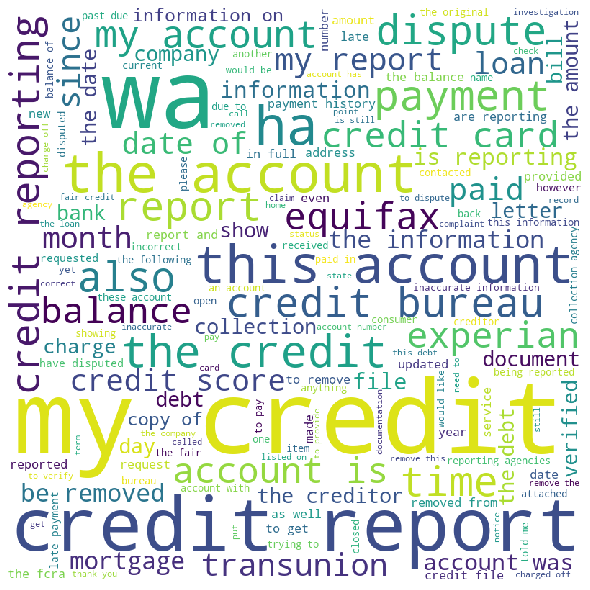

Cluster number: 1
in preparation of foreclosure bank of america stopped paying the portion of the hazard insurance as a previously mha hamp modified home loan mortgage account guidelines require the establishment and continuation of an escrow account for the purposes of ensuring the payment of property taxes hazard insurance and natural disaster acts of god insurance as appropriate appropriateness is indicated when natural disaster property insurance is offered by the state in this instance the state of california offers earthquake insurance for interested homeowners bank of america incorrectly and improperly effectively cancelled the property insurance without the borrower consent when it refused to continue to pay the portion of the hazard insurance for the property as bank of america had been doing before simply stopping when deciding to move forward with foreclosure 

i was approved for a trial period plan under the home affordable modification program with my servicer sls on my fi

i was two months ahead on my mortgage then within days countrywide foreclosed on me stating that i was months behind all within days i proved to them on several occasions that i was correct and that they are wrong several of their people agreed with me in my assessments but were no longer in contact with me they lied cheated defamed me and foreclosed on me then coerced me into a very false modification what i originally read and thought i had sighed turned out to be significantly different they put a balloon payment with an adjustable rate and then put years to pay incredible this has cause me extremely great distress and hardships while destroying my credit and any hopes of paying off the mortgage please any and all help would be greaty appreciated thanks sincerely 

 hereinafter has been trying to get a loan modification for more than a however her efforts have not been met with the same intensity by wells fargo home loans hereinafter wells fargo after working extremely hard to solve

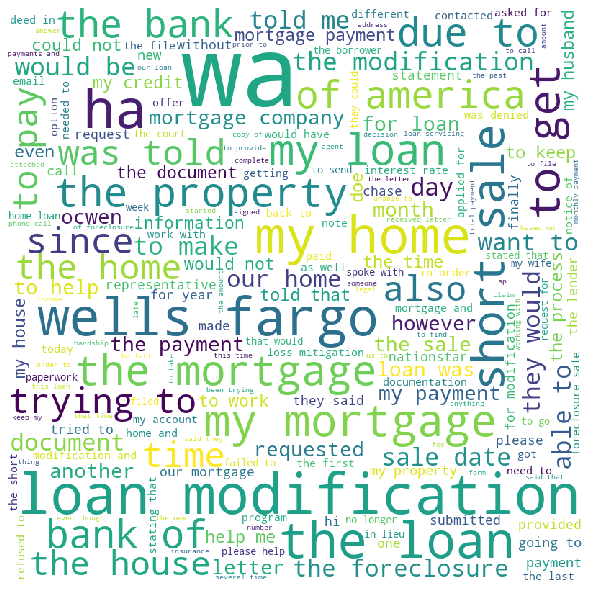

Cluster number: 2
check out for detailed descriptions on how ge bank capital loans is ripping of people with a loan scam a loan officer called me from an unknown line about every minutes throughout the day for days when he realized i was not going to answer he called and left his name and phone number so i called it an irritated person answered and he plainly said take out a loan for and give us our money or i would regret it i said that i do n t need a loan and hung up he had a accent and has not called since 

i applied for a car loan and the auto dealer received credit reports one from which gave me a score of and one from sagestream llc which gave me a credit score of i called sagestream numerous times to discuss the score i received but they failed to return my call the address for sagestream is california the telephone number is i would like this company to respond to my inquiry 

chase auto made a hard inquire on my credit report without my consent

i leased a from herbies auto 

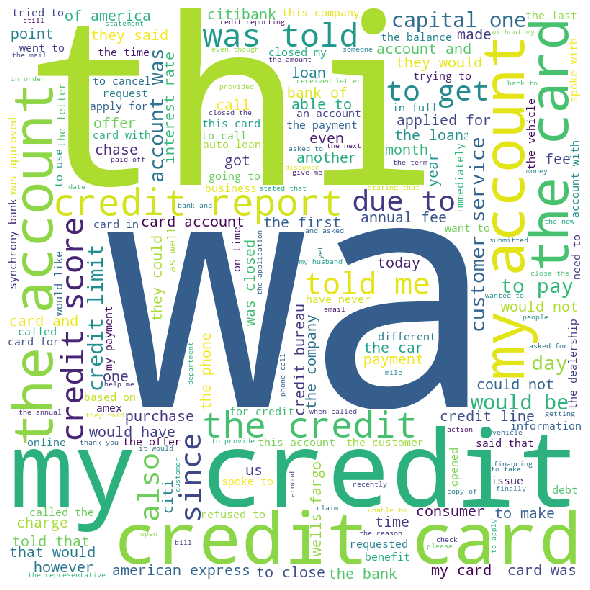

Cluster number: 3
we were debited earned cash back rewards from citi visa the credits were earned with purchases on their card we had a refund returned on the citi visa for a purchase that was made on both cards were issued through costco we received a reward from the purchase but deducted in cash back rewards from citi on the refund they should have only deducted we made two calls to them to correct the error and they refused stating it was an automated process it is our position that this was a fraudulent transaction on their part we earned the cash back credits per the terms of their card agreement and citi wrongfully deducted the earned cash of 

i attended a presentation in and the company ran my credit card for almost i did not authorize the charges i revisited the merchant after seeing the charge they provided me a letter stating they would refund my monies this never occured i called citibank my card issuer opened a fraud dispute at the customer service reps advice heard nothin

i have a credit card account with capital one i recently found out that they reported me days late to the credit bureaus between and i do n t agree that i was ever days late and contacted capital one on separate occasions to dispute their claim beginning on i ve requested my account statements as proof of my delinquent payments separate times now they have sent me letters stating the proof was enclosed but there were no statements included with their letter nor any other type of proof i ve called them repeatedly requesting proof of their claim and they keep telling me i have to submit my request by mail or fax which i ve done they have yet to provide me with any documentation that supports their claim which is why i am filing this complaint 

Number of entries: 1690


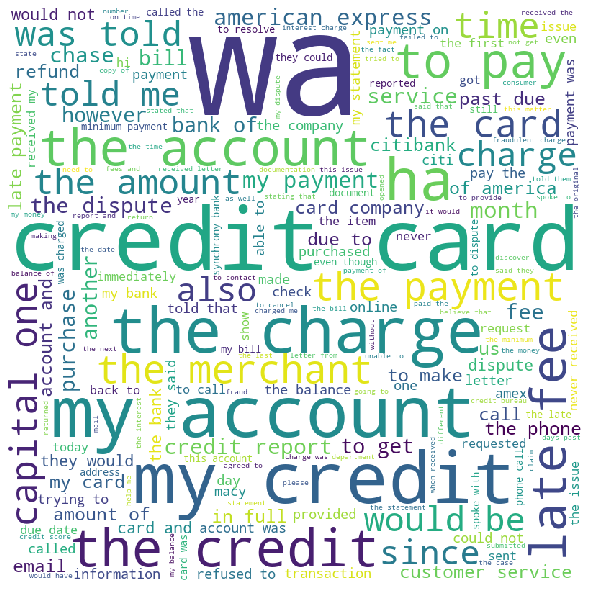

Cluster number: 4
in s i took out federal college loans for total of before i graduated i was contacted by and they were insisting to consolidate my loans they were persistent and kept saying that i will benefit from it as would actually pay less my monthly rates would go down etc the repayment was planned for years i ve signed consolidation agreement with on they have increased my interest rate to and the fact that they were interest was not included that worked out of interest alone also on the only form i d signed and sent back to somebody marked max option years interest only more crucial info was on the forms i ve never seen until now navient sent them and they have no signature of mine after i graduated got payment book with payment slips from and was paying my loan for consecutive years never missed a payment or was late then i called them to check my balance and told me that now i owe them and did n t even pay the interest yet i was confused and kept paying at some point i ve d

Number of entries: 1532


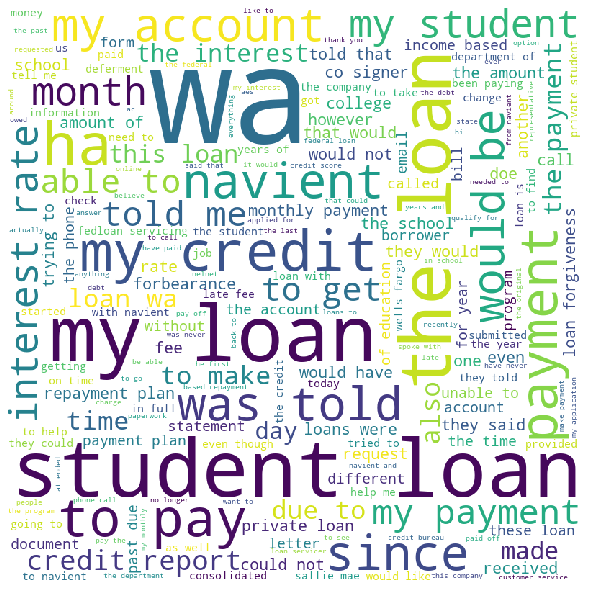

Cluster number: 5
this is my official complaint against the billing practices and violations of tila and regulation e by santander consumer finance on i was involved in a car accident and thusly my nissan maxima was the car was financed through santander consumer finance in correlation with my insurance company santander was also notified of the accident my insurance company made a payment to santander for the price of the car in of the remaining amount owed to santander by me is an estimated per my original note with santander my original monthly payments were prior to the date of the accident i received a call from santander on requesting that a payment be made and to advise me that i was days past due of asking that i make a payment with them again i had not received any response from santander to the accident until the call i told the representative that i needed to be provided a disclosure in writing outlining terms and conditions of the loan modification first the representative 


the company has been incorrectly reporting that i have an open account with them and reporting it as days past due every month lowering my score disputes have been filed and the company has not corrected the information on my credit report 

this is an issue with santander consumer auto lender who is constantly reporting a negative balance of that has been charged off i ve paid the full principle balance of the loan there was a dispute concerning late fee but santander never provided any documentation justifying any fee s

i submitted a complaint against midland credit recently my complaint is that i m still having the same issues for the last two years which is that midland continues to report inaccurate information on my credit report midland funding said that they had removed the dispute notation from my account however when i contacted the credit reporting agencies for an updated credit report my credit report shows that midland is still reporting that i m disputing the account i 

on i applied for an installment loan with ace cash express for the amount of ace cash express deposited the funds into my primary checking account on according to the agreement i am to make payments in the amount of with an initial payment of the initial payment was deducted from my account on as of i had repaid i contacted ace cash express on to get a pay off quote and i was informed that the pay off through is i ve complied with the loan agreement and made payments as scheduled but only has gone toward the premium balance i have ceased making payments until i can get a resolution on the interest this is a predatory loan and i do n t think it is legal i m seeking assistance for a resolution i am not opposed to paying the loan as i have taken loans with ace cash express in the past but i was always in a position to pay the loan in full within a couple of weeks so i did not realize that this company specializes in predatory loans 

Number of entries: 3615


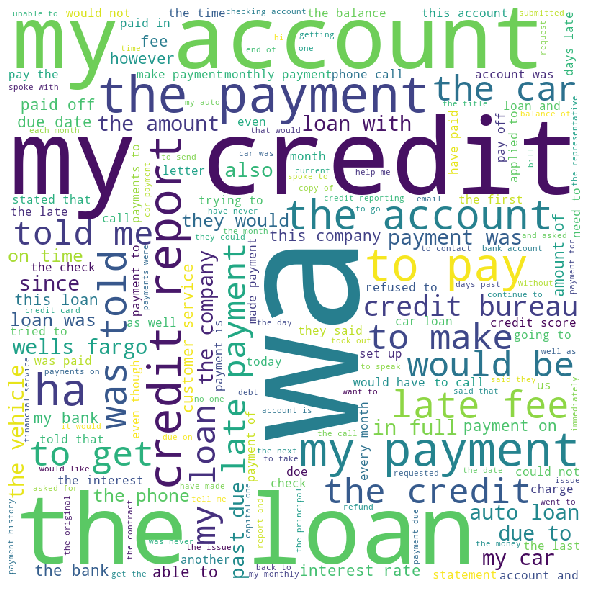

Cluster number: 6
on friday i suffered double discrimination at chase bank when my wife and i tried to open a joint checking account i presented my driver s license and an atm from another bank for id s my wife presented her driver s license but she did n t have an atm the bank officer requested a passport which my wife did n t have we asked him if we could present other documents but we did n t have those i asked again and he was rude and insisted and insisted on paystubs passport even an alien card we are americans my wife got really upset crying this person was talking to us like we were criminals i m also a person i asked for a supervisor who instead of apologizing for his worker s actions he made things worst then i suggested if we could present social security cards and both looked at me with surprise like i never had one then the manager said we could be use the social security cards as ids i asked why the bank officer did not mention that at first place and avoid all that troub

scottrade continues to report fraudulent information to my tax file using information that is knowingly false and admittedly in dispute throughout complaint forums and other media customers continue to have problems with scottrade reporting false information to the irs and refusing to correct it i am suffering some the same failure and as a result have suffered significant damages i kindly request scottrade remove the information submitted to the irs in accordance with my previously submitted letters 

chase bank closed all of my accounts without providing a reason when i ask for an explanation all that i m told is chase has decided that they no longer want do business with you and we have terminated our relationship 

i have a health savings account with wells fargo we were told that it is being transferred to on sent a new card and instructions to log in to my account which i was unable to do i called both and wells and discovered that somehow my account is associated with a complete

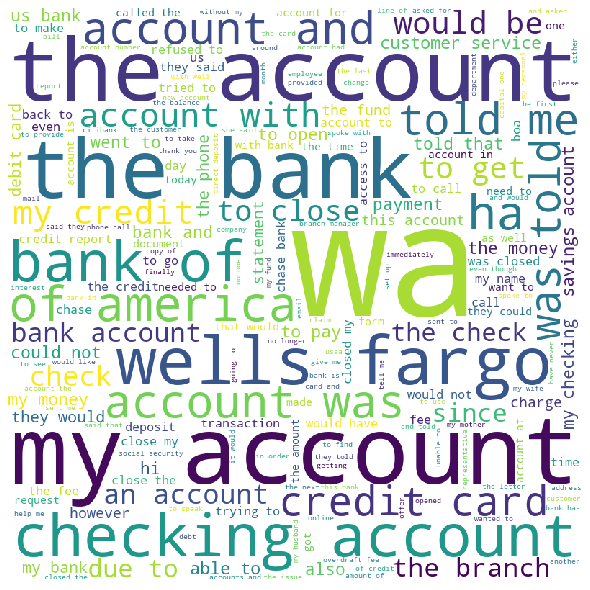

Cluster number: 7
i brought a bed from sleepys on credit the credit was provided by synchrony bank the amount of the purchase was as soon as i bought the bed i scheduled online monthly payments from my bank account on monthly basis on the of every month adding up to within the time period i was responsible to make the entire payment without an charges however now that i go and check i am charged late fees i contacted the bank on and i was being told that i am charged for prepayment because the system does not recognize the prepayment and instead of applying against the amount due for it has been applied against the minimum monthly amount due i am being charged i think that i am being cheated despite the fact that i have made total amount due 

i have a bank of america issued credit card this card has been used monthly since until this month the card has always had a grace period this month a late was assessed on the due date for payment i have excellent credit and always pay in full ea


i reached out to multiple parties at pnc bank for issues without any success new account bonus get a different story every time excessive overdraft charges that i can not get any recent response to the following is more information bonus i opened a virtual wallet performance select checking account with a savings account via a banner ad in of the banner ad specified requirements and i met all the requirements i have been following up for over years now and i get different answers everywhere i go in the branch told me to call the number they told me that i opened the account in a branch i never visited and thus was not eligible i went back to a branch and was told that sometimes they assign online accounts to branches i called the number again and they said there was nothing they could do i go back to branch and escalate and they have someone from give me a call they leave a name and number and no one returns my call finally i find someone and they say that it s too old i find a vp and

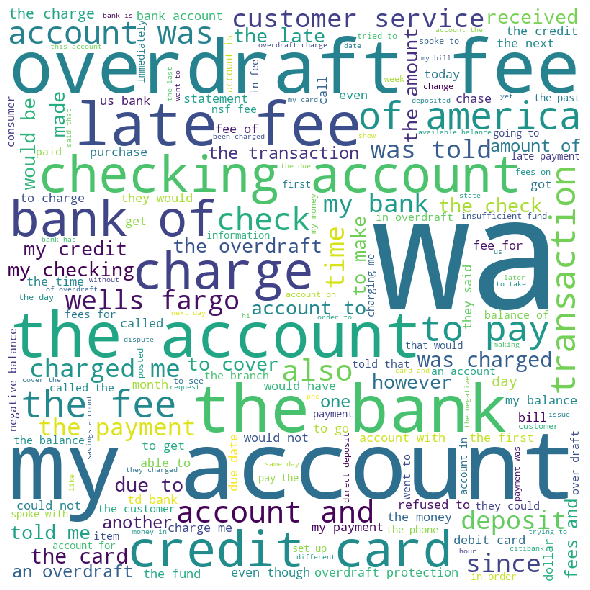

Cluster number: 8
i applied for a loan from big picture loans and i was approved for and i was told that i would have a finance fee of which would mean i would pay back i just started paying the loan and when i saw the amount of payments and how much i would be charged i was appalled i am being charged in interest which would make my final pay off i started making payments and this loan has me making payments until i am willing to pay back the loan and the finance charge but i really do n t want to end making payments of for a loan 

i responded to an offer by citibank to pay off my existing credit cards with a offer for months i responded and requested them to pay off credit cards with for a total of i submitted both requests in the mail i was later informed that the offer expired sometime before they received my request or by the time they submitted it to but they made the payments on my behalf however the interest rate would be instead of i called and asked if the offer had expired 

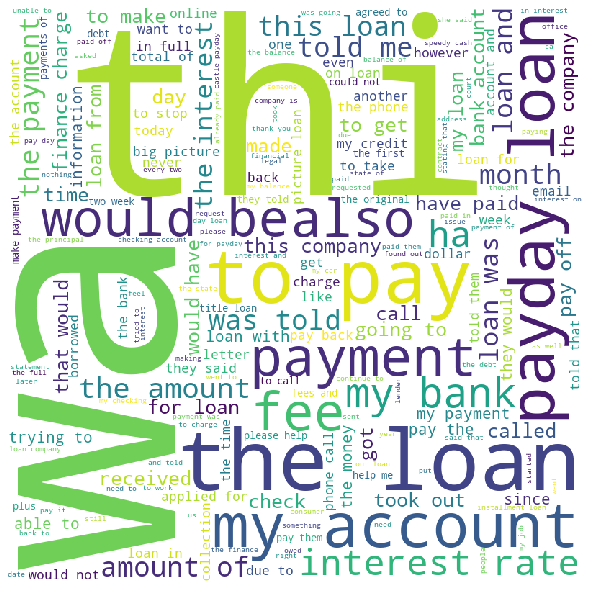

Cluster number: 9
i have been receiving calls from the erc debt collection agency for a person named there is no person by the name that lives here no one by that name on any of the bills or mortgage associated with my address or by that name in my family i have told the debt collector that and have been told they would mark my phone number as invalid they lied because they have continued to harass me 

was referred to addvantageusa from my credit repair company was approved and ordered a laptop whichwas never shipped cancelled the laptop order i am now receiving statements and collection calls from uas universal acoount servicing llc it states right on the statement its for my acct with i cancelled all orders in with addvantageusa they have debitted money from my checking account for a laptop inhave never received i have called every week since i have also tried to start a chat on their website three separate times they stated that they were going to take care of this and nothing has 

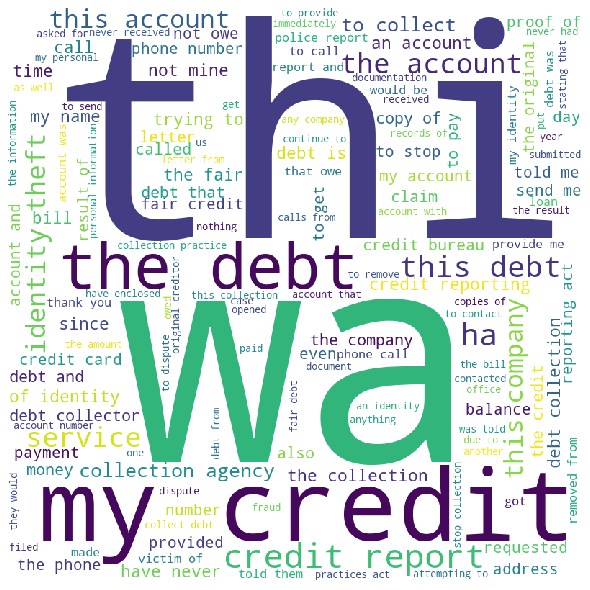

Cluster number: 10
i opened an american express business card for a company i worked for i was asked for certain information over the telephone like my ssn and i had admittedly asked the rep was my credit being pulled or was the credit going to use my credit i was told no i said perfect because this is not my card it is intended to be a business and i did not agree to have my credit touched i filed a consumer complaint a year ago because of the terms of the card i was told thing and the company received different terms then what was told to me i did not know my credit was linked to this card until i receive a irs document saying i have to claim income because the company had settled the card amount with american express i would like to file a formal complaint on my own behalf because i was lied to and i have tried to get american express to fix their mistake i found out it was on my credit report also i called american express to get it removed from my credit i never given permission t

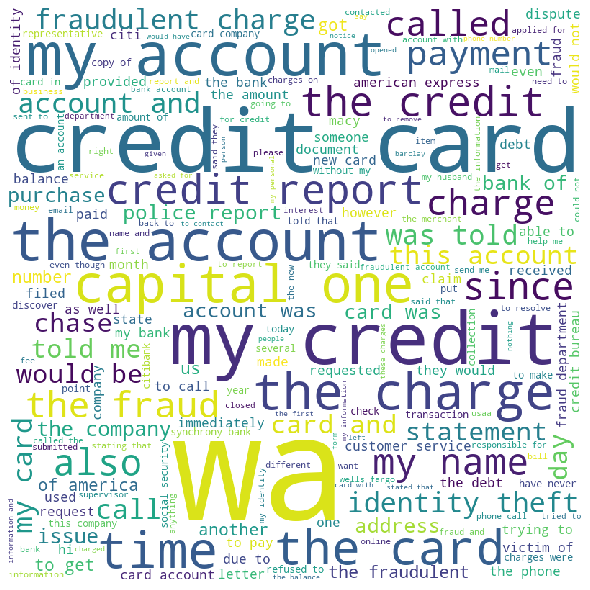

Cluster number: 11
my complaint is with american express i have had a american express card for a number of years because my roundtrip mileage to visit the nearest was either miles to the pa area or miles to md and they opened a s only miles rt from my home i decided to allow my ame to expire i continued to use my card accumulating approximately in cash back rewards since amex severed its relationship with i was told that i was no longer entitled to any of the accumulated cash back rewards i find it interesting that amex gladly accepted my charges for more than a year including a charge after my membership expired i have tried to resolve this by phone on several times but have not been successful only getting contacted with their overseas customer service who claims they were unable to transfer me to the us offices 

i have paid a annual fee for my us bank platinum visa card and the cardmember benefit statement stated as one of the benefits bonus award night exclusively for card member

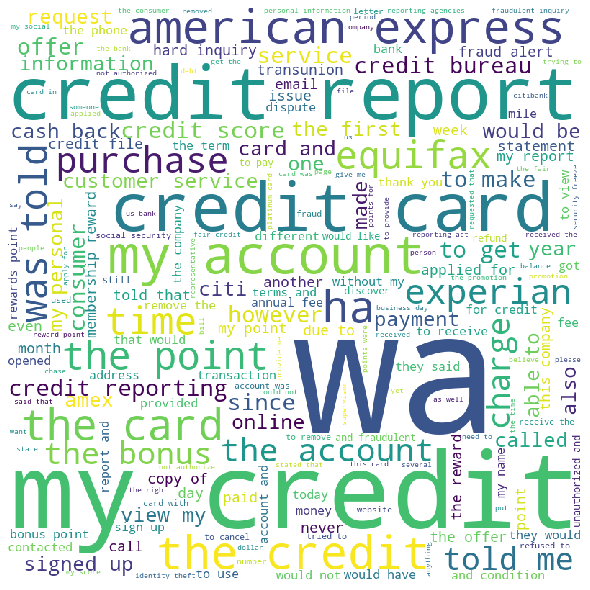

Cluster number: 12
my mortgage was sold to pnc mortgage an out of state company in order to make my monthly payments pnc requires that they receive my payment by the due date however because i do not have an account with pnc and can not get an account they charge me a fee of for the privilege of paying them on line i have tried using regular mail but usps is unreliable even with using priority mail it has taken up to days because usps for some reason first sent the payment to the wrong state as a result i incurred both a late payment on my account and an late payment fee it seems that there needs to be rules which regulate what banks can charge as fees and if the bank does not have a local walk in method for payment they should make it possible to make online payments for free or very low cost to pay your mortgage is too much i think or something is the maximum which should be allowed over the life of a year mortgage a monthly fee adds up to thousands of dollars 

i have been trying to

i paid off the mortgage to champion mortgage in for the estate of my uncle they sent me written affirmation that it was paid off on the forced place insurance company settled with me for in damages to the property which had the mortgage in but the mortgage company insisted it receive the check on champion mortgage informed me that it had received the check from the insurance company but was holding it pending a showing that the repairs had been made i have tried to convince the mortgage company to send me the check since champion no longer had any interest or was owed anything on the mortgage and have received numerous reasons why it could not do so including saying the check was in the mail though it had not reached me days after their saying so ironically champion ap plied an earlier insurance check that was issued in to the unpaid balance of the mortgage without asking my permission i would like the money with interest asap i am the legally appointed administrator for the property 


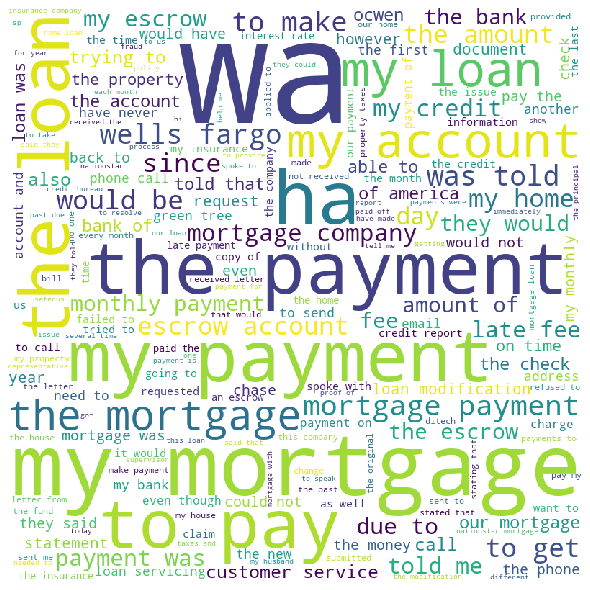

Cluster number: 13
i signed up with the law group in i was promised that they would have me debt free in months although they did settle a bunch of my accounts they did not settle everything and i was forced to open a global client solutions account and allow them to make monthly withdrawals when i looked at my balances it was obvious that i was paying way more in fees to gcs and than to my creditors i paid in a total of and about was retained by gcs as fees i think this is illegal when i complained to gcs about the fees they insisted that was taking the fees not them i am not getting a straight answer out of anyone they were supposed to only take of the money they saved me but they took almost of the monies i paid in i am unable to upload my supporting documentation but if you will email me a direct email address i will forward the correspondence to you they made all kinds of bogus claims that i added new accounts etc which i never did also gcs is denying any responsibility for the fe

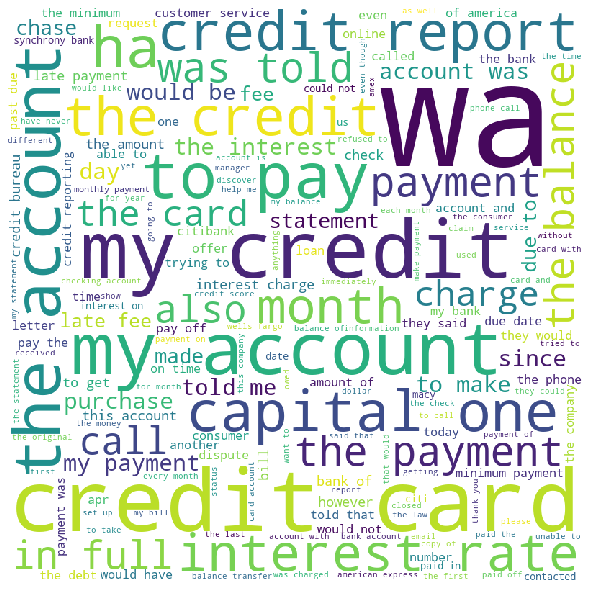

Cluster number: 14
i do not know who these people are i never had any notice of any debt from them credit bureau associates is in violation of the fair debt collection practice act specific violations are u s code c commu nication in connection with debt collecti on a communication w ith the consumer generally without the prior consent of the consumer given directly to the debt collector or the express permission of a court of competent jurisdiction a debt coll ector may not communicate with a consumer in connection with the collection of any debt you did not have prior consent directly given to you by me the consumer or you did not receive express permission of a ny court of competent jurisdiction to communicate with me the consumer you have also violated the fair credit reporting act u s code 

account was not mine it belonged to a spouse erc has never attempted to contact me in regards to this assumed debt i have not be notified via any channel mail phone or electronically when i ca

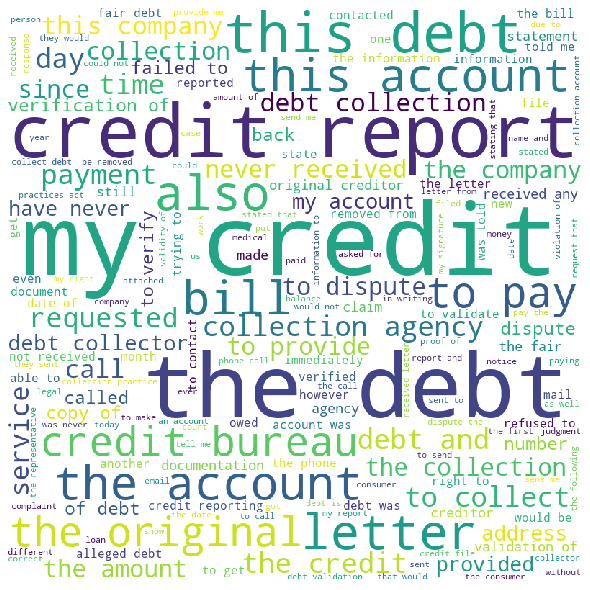

Cluster number: 15
re case so is the result that my options are to either sue american express centurion bank in small claims court or allow them to keep of my money that they have admitted that they received custody of in my behalf and you have no authority nor can refer me to an authority for assistance with my issue 

deposited a check into my account bofa is telling me i cant have my money for weeks because will not verify i spoke with and they are telling me they have submitted everything they can and that my bank is lying to me and that the funds have been drawn from my employers account already i am going to lose my job due to the fact i can not purchase gas and i am miles from home in a new state

on i called to informed sun trust that i was resending my permission for them to do and automatic debit for a car payment i have with sun trust at no time was a advised they could not stop the payment what i was advised of is that the payment will not be deducted thereby the purchases

their system seizes up several times a day making a quick trade near impossible the entire money balance even if you are sitting on all cash fluctuates wildly right in front of your eyes limit orders do not kick in and then they blame a fast moving market even if the market is slow and records show that it crossed higher than your limit sell price if you were trying to limit sell for a profit anything that goes against you in the system they blame you nothing they do is ever wrong according to them on they blamed fast moving markets for the now acknowledged technical glitch and refuse to reverse any erroneous trades each transaction has to be baby sat because their system is weak and potentially very dangerously flawed or worse intentionally corrupt when first setting up the account they shredded valuable documents that had to be all redone that should have been a huge red flag this caused financial losses 

i opened a checking account on and moved to a new state shortly after citibank

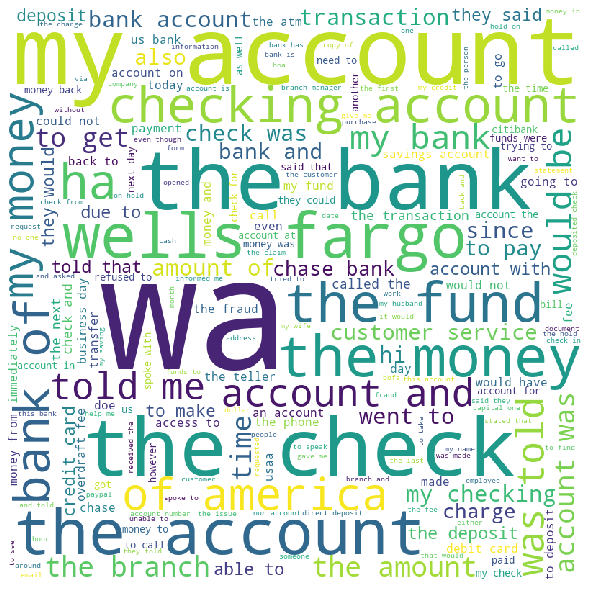

Cluster number: 16
trying to remove inquiry from nj which was done without my permission 

i have asked experian several times to verify a charged off account that is reporting on my credit report by sending me the documents they keep saying they have used to verify the account it has been days and they have again said the account is verified with no proof of verification that i have repeatedly asked for i would like this account removed from my account 

over the past years i have disputed a judgment that was dismissed i submitted several complaints to both equifax and cfpb and no favorable actions manifested on a representative indicated the investigation was complete and that traditionally when evidence of a dismissed judgment is provided then removal follows the investigation i provided with my complaint the documentation which has been attached for your review however another equifax representative indicated on that there would be no removal since the court placed the judgment on 

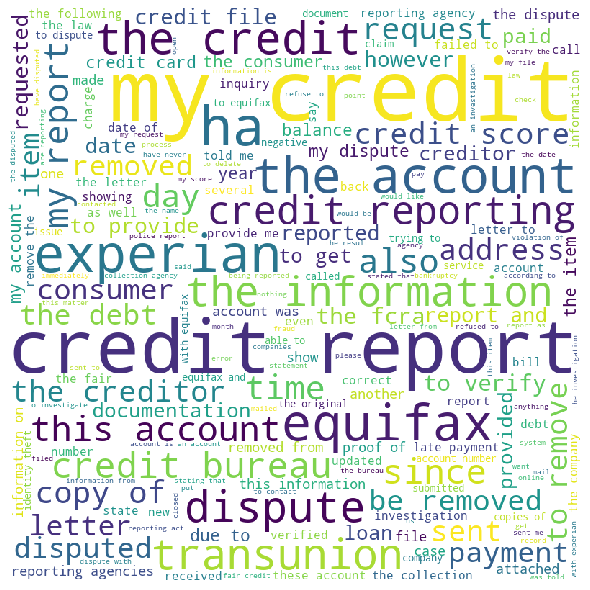

Cluster number: 17
i have a prepaid rushcard that i still cant use at this time the company states that the problem is fixed but i am still getting error messages when i try to transfer money 

dear sir i have been with chase bank for years lately i tried to wire some money to my father in the transaction was made on the and it is wire transfer outgoing and it was made in person at chase bank tx and the bank teller was able to determine my father s account number and she told me the money will be available on on i was contacted by phone someone called he wants more information about me and my father and he said he ca n t send the money if i do not do so when i long in my bank account online i see the money was transferred until the i saw that the money was credited back without the so i called for that reason and i got it back i asked the teller what kind of information you need to make it happen so she said both bank accounts that s all i do n t know why i was mistreated like this i a

Number of entries: 2295


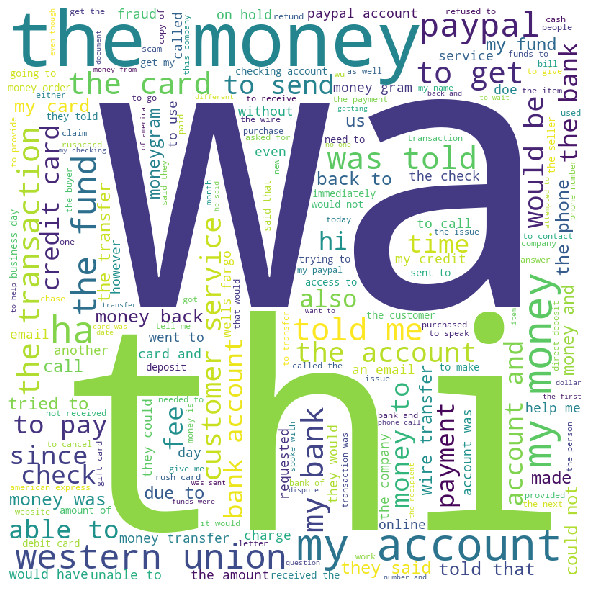

Cluster number: 18
i have disputed this information as being fraudulent and not mine or opened by me they have disregarded some of my disputed and then some they have said the accounts were verified which could not be because the credit grantor could not provide me with proof the accounts were opened by me i have been dealing with this issue for over a year now and i m at the point to where i need to hire an attorney to get this resolved if this dispute is n t settled this time if that is the case i will be suing the credit reporting agency and the original credit grantor on file for each account in dispute 

i noticed i have hard inquires my report i did not apply for how doi get them off i am trying to raise my score and i have read these are not good i am a new member and i thank you so much for all this information i would not even know about these inquires 

i have hard and soft inquiries that are not from me they are from my ex now hevea doing this when we were separated and i do

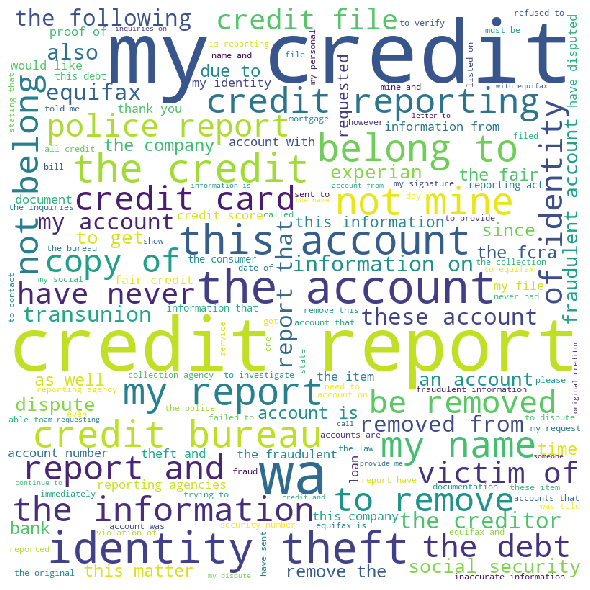

Cluster number: 19
there should only be one name and one address on my credit report wisconsin this is the only name and address that should be used on my credit report 

i found more social security on my name and i just have i dint have more than 

when my son moved out the post office also forwarded mail in my maiden name and reported his apartment address on my credit report but i never lived there and still liveown my house on attached are current utility bills 

i am buying a home with the closing scheduled for when my loan officer recently tried to access my credit report info with experian and he found that i was classified as deceased on both agencies records this apparently happened when reported my husband s death in to the credit bureaus he and i held a joint home equity account it is imperative that the deceased designation for my name be removed at once so we can continue to prepare for the house closing both experian and indicated that made this report but denies having 

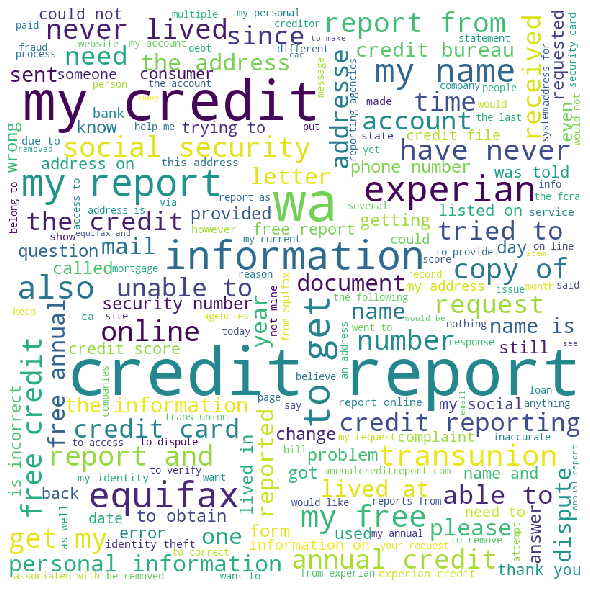

Cluster number: 20
this is going to capital one auto finance we have a loan with them for a vehicle first thing that happened we made a payment on line which was suppose to be free and was charged a fee which they would not refund second is that will not take either one of oour debit cards for a payment so we either mail it or go thru third even though it states you can call them to at we can not get them to answer the phone fourth the payments fell behind and about two weeks ago they came for the vehicle my son called that same day and they gave him until to make a payment to catch up and told him they would add the holding fee to the end of the loan we made the payment thru and when he called the next day to get the vehicle back they sent it to auction told him he would have to come up with the holding fee now they are saying they did not tell him that info when he talked to a rep two weeks ago and found out then what he needed to pay it has been one thing after another with them the

Number of entries: 2477


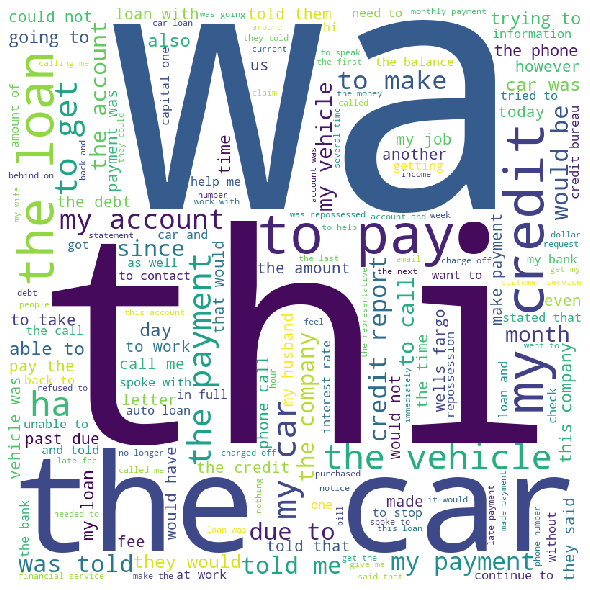

Cluster number: 21
my credit limit is i want balance transfer from but my credit card company told me i can only transfer from that but why this is not mentioned in cardmember agreement also i called times but they do not give me reasonable reason i say what is meaning of agreement they told me i can transfer only of credit line but this never mention any where in cardmember agreement actually they offered balance transfer for months please see attached cardholders aggreement 

my husband and i tried to cash a check from the my husbands work credit union at on it was declined i came home and called the credit union and they assured me that the check was good we tried again at our bank is closed on saturdays again the check was declined i have called certegy customer service over and over again i have never spoken to a live person all i ever get is a recording and then i am put on hold endless hold for hours at a time my husband and i never write checks we use a debit card all the time 


Number of entries: 1694


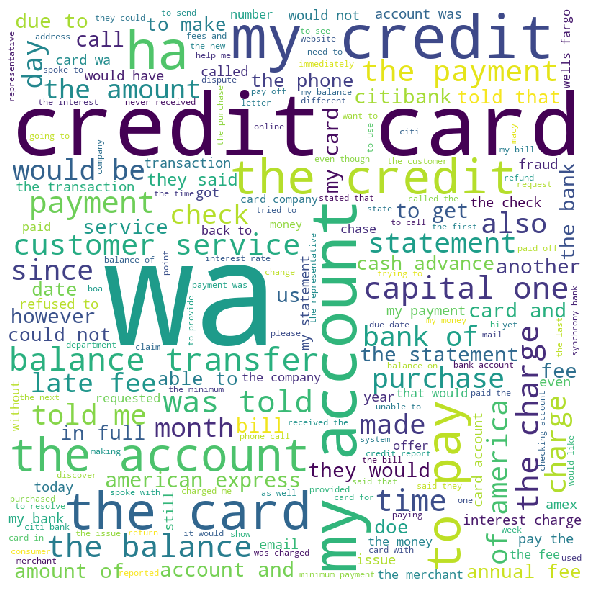

Cluster number: 22
the information was closed and reversed

i received an unexpected public record on my transunion credit report on for a circuit court it states that it was reported as of this account has never been on my credit report and i have attached proof we are in and i am concerned as to how transunion can report a negative public record from on my report causing my transunion score to drop dramatically this public record needs to be deleted from my credit report immediately i have attached a copy of a recent transunion credit report showing that this public record was not showing up on my credit file under the public records section here we are a year later and transunion is inaccurately and illegally reporting that this public record was reported as of 

Number of entries: 1026


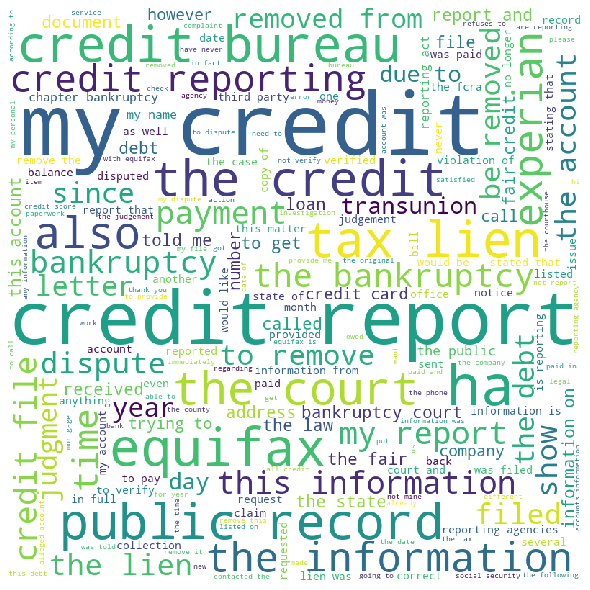

Cluster number: 23
i paid my co pay and paid their part of the bill these are extra charges never billed to me but ended up on my credit report the collection agency had removed these charges but put them back on my credit report after i paid bills 

i am filing this complaint because experian has ignored my request to provide me with the documents that their company has on file that was used to verify the accounts i disputed being that they have gone past the day mark and can not verify these accounts under section a of the fcra they are required to promptly delete all information which can not be verified that i have disputed please resolve this manner as soon as possible thank you 

Number of entries: 1183


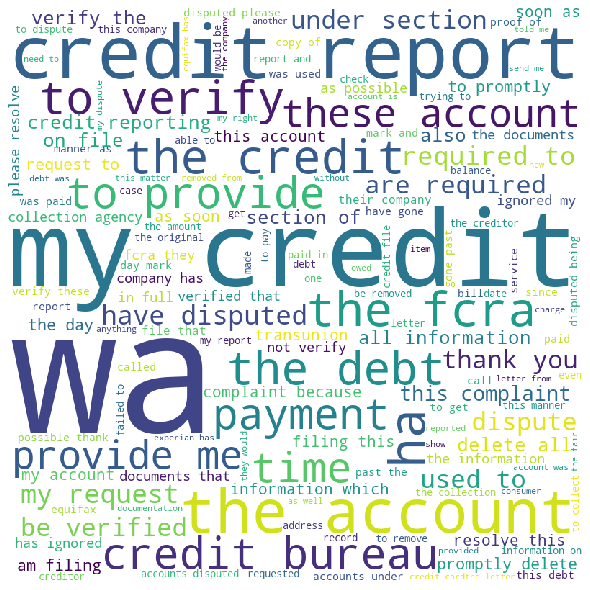

Cluster number: 24
i requested a deferment until i found a job that i could make the payment and the principle triple in the amount owed 

school nj i have multiple private student loans with jpmorgan chase approximately a year before this incident i received notification that servicing of these loans was being transitioned over to of these loans came due in sent a notification of the loan coming due via email on i called on to ask about defermentforbearance options sent me a form for forbearance that was the wrong form it did not apply to my situation in the slightest at this time i became busy with many other things i an an working hours a week and i have other student loans i m following and forgot to call back regarding the form sent no additional notifications that the loan was due past due or about to default i received no calls emails or mailings regarding this with every other loan servicer i have ever had i have received multiple calls emails andor mailings warning me of past 


in i attended a in pa the school is no longer and i the sallie mae loan was the lender the school was using the loan has gone into default i can afford to pay the loan or the interest sallie mae is asking what can i do to settle this issue 

Number of entries: 1226


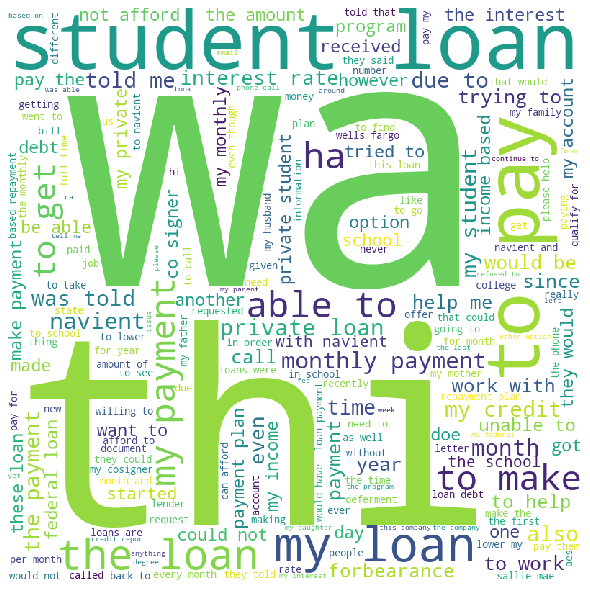

Cluster number: 25
the consumer reporting agency has repeatedly falsified information on my credit report the false information has made a drastic negative impact on my credit score this impact has prevented me from goals such as home ownership among others the reporting agency has updated information on several accounts that have been closed for a extensive time thus violating the fair credit reporting act the following are closed accounts that have updated as late or past due in recent months closed showing past due in also showing incorrect amounts closed showing as past due in closed showing as past due closed showing past due showing past due closed showing past these items are reporting as if they are recently past due thus leaving new creditors to believe my current situation is such that i may not pay them responsibly 

on my account through credit karma i have negative remarks due to late payments i believe this incorrect 

i have a recurring issue with equifax refusing to cor

Number of entries: 1633


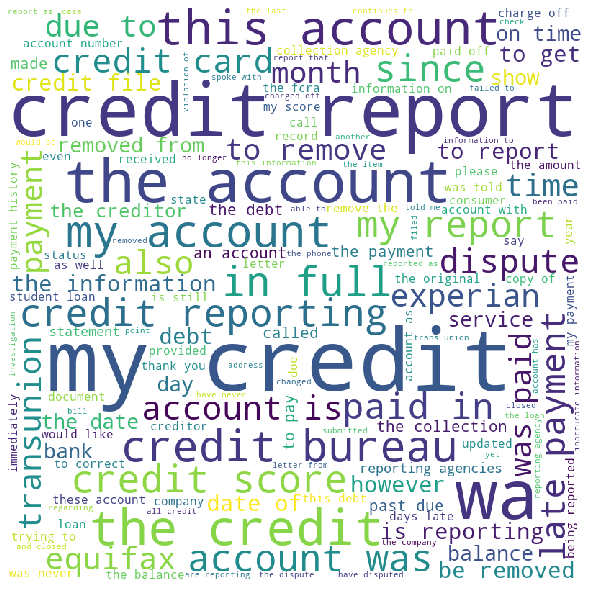

Cluster number: 26
my mother died in and at the time of her death was leasing a car from honda financial services with whom her account was in good standing i e she had made all lease payments on time and in full upon her death we voluntarily surrendered her car to honda financial services in pristine condition provided honda with a copy of my mother s death certificate and proactively inquired as to what balance was owed on her lease in response honda first sent a confusing letter in that insinuated a that they had repossessed the vehicle when in fact it was voluntarily returned and b that my deceased mother owed honda a gross early termination amount in spite of a lease agreement that specifies that the early termination liability is the lesser of the remaining payments due on the lease term which in total amounted to only or the standard early termination liability good luck figuring out the legal jargon used to articulate the definition for this term now honda has sent corresponden

Number of entries: 1221


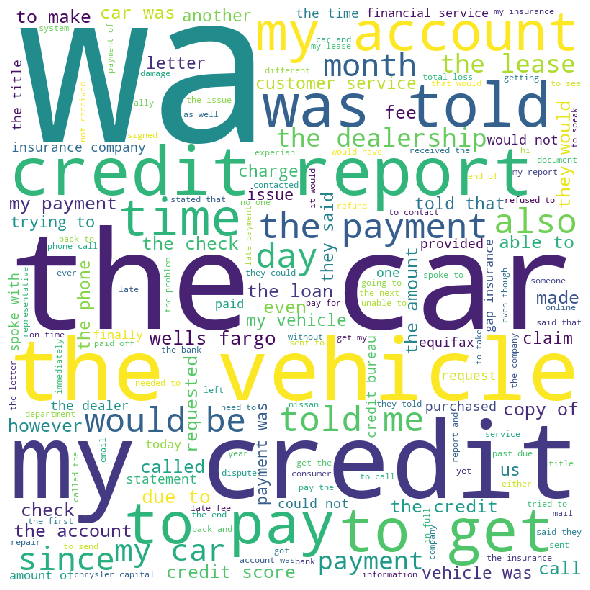

Cluster number: 27
synchrony bank s payment scheduling system changes the customer s chosen payment posting date if any part of the payment detail is changed i have noticed an issue where synchrony bank credit accounts change a payment scheduled date chosen by customer to the payment due date if the payment amount is edited example amazon store credit due by initially chose to pay minimum on date funds available and date scheduled advanced to confirmation page but decided to increase payment amount slightly when clicked edit payment button reverted to payment page selected payment amount still selected not changed to minimum due but payment date posting date reverted from initially selected to due date of edited amount to did n t catch as i have many many other times that the date changed to due date did not realize the date changed until checking my bank account that all payments scheduled for had cleared and noticed the payment that i thought to my amazon account had not yet posted w

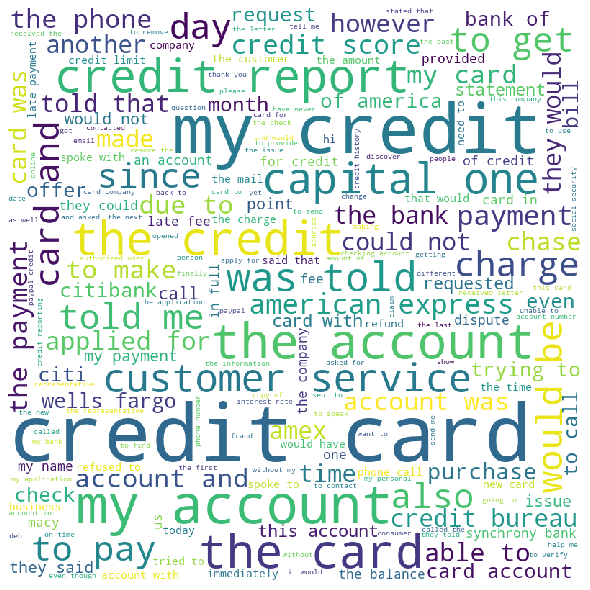

Cluster number: 28
santander consumer usa i purchased a vehicle through santander usa in i have made payments of and still owe the payoff amount changes from day to day they are staying that i owe + in late fees how is that they could not give me a proper answer i do not understand how i have made payments of and the principle has not decreased 

i have had several things added on my credit due to identity theft and this is one of them i have tried to talk to this company and solve the problem with them but there has been no budge i did not open this account and feel that it is wrong that i continue to suffer for it please resolve this immediately 

 re illegal business practices at infinity nissan infinity acct i have a lease contract for months with infinity financial for a vehicle that started and will end all monthly payment has been made on i became aware that infinity was tell us that they are missing a payment since and that all the payments we were making was being posted as la

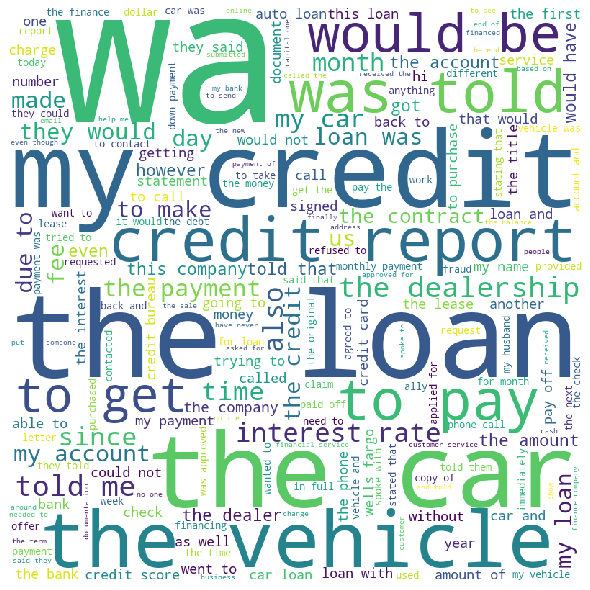

Cluster number: 29
an unauthorized charge of was taken from my prepaid credit card and applied to my estranged husbands account when i contacted the company they said that because the card was used previously on the account that they are authorized to take the funds the card was supposed to have been transferred to my new account when i established it a few months ago i have filed a complaint with american express and with both with no success american express said they would contact me within ten days with a response as to whether or not they will return the money but dispite several calls to them they will not connect me with anyone in the dispute division they just keep saying it may take longer than the days its been over a month since i first contacted them to correct this issue your webpage states that they need to respond within the ten days or refund the money minus up to can you please help me 

i was using a netspend prepaid card i had reloaded the card and within an hour aft

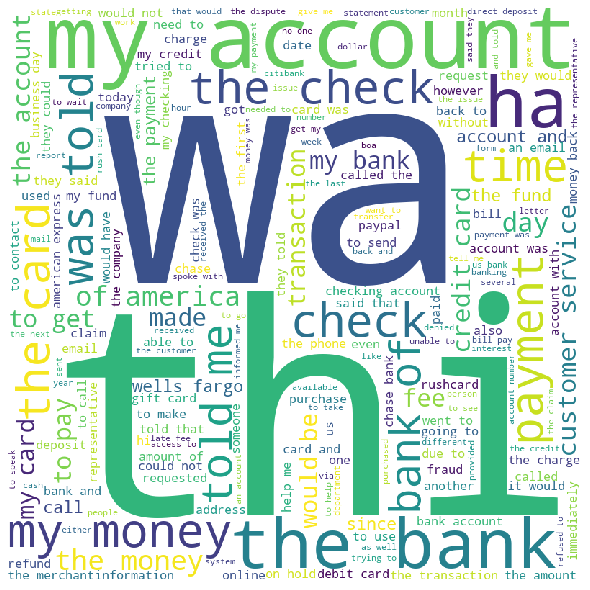

Cluster number: 30
i have been consistently paying navient private loan for over years originally they were collecting my extra monthly payment and using it for future payments my balance would should every month due to over paying years ago i found out about this dirty practice and had them change extra payments to go towards principle loan these past months it seems they changed my payment method back to extra payments being pushed to future interest or pay showing a monthly pay balance after paying off on a specific loan i repeatedly told a navient rep months ago i want extra payments to go towards principle they did not comply to my request and have continued to keep my payment method same this is a dirty practice and they are collecting free money from the hardworking consumers the loan balance has not gone down and they are stealing i would have been done paying off the private loan had they put my extra payments to the principle loan please put a stop to this form of payment sys

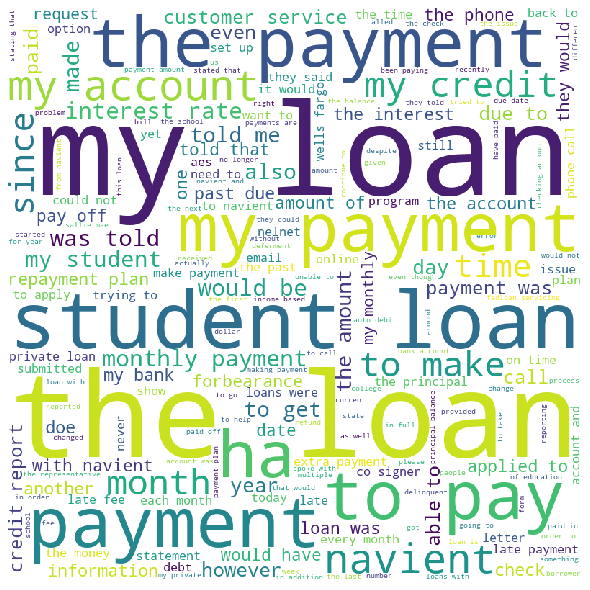

Cluster number: 31
i called my bank bofa to ask for a new debit card as the one i have the magnetic strip seem to be worn they told me that i have to pay to replace it because it is not expired as yet is this fair to ask a consumer to pay for a new debit card 

on i checked my account balance to obtain what i had available my available balance was i withdraw which left me a remaining balance of i logged onto pnc com website to obtain my balance and it stated that i only had out pnc charged for a unknown fee and when i called to speak with a rep he was unable to specify what was the fee for i have direct deposit and a total of deposit from my employer and child support combine together and pnc never charged me a sevice fee i asked to speak with a manager since the representative was unable to assist me i was on hold for and no one came to the phone i m disputing those charges of and 

to start with i am on limited income disability and i saved up months to do this in town trip i planned

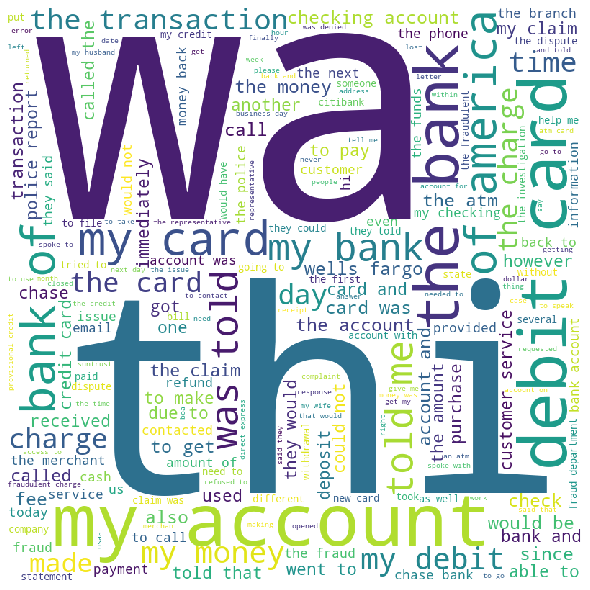

Cluster number: 32
i am a cosigner on my daughter s student loans as outlined in the pending suites we have been victimized by navient s unfair deceptive and predatory business practices on numerous occasions navient has not been helpful in trying to resolve issues and as noted in the various government complaints tried to steered us into more costly forbearance there have also been instances where monies have been misapplied to loans i have been trying to work out a plan of action to get current with navient but have encountered resistance at each turn i also feel i have been outright lied to concerning information on payment postings 

i am writing to dispute the following information that your company provided to all major credit bureaus and i have circled the items i dispute on the attached copies of the credit reports i received the item that i am disputing is the second reporting from your company of my student loans on my credit bureau according the fair credit reporting act you

Number of entries: 698


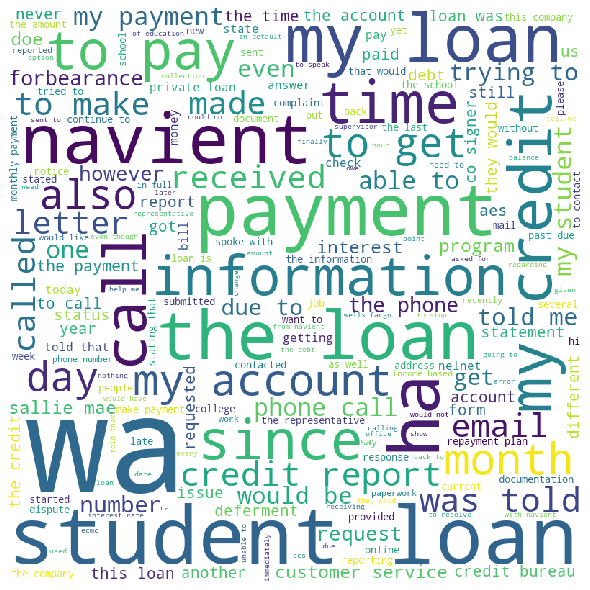

Cluster number: 33
i would like to start by stating that i ve been an customer since they changed over from has been over years i ve never had any previous problems with our carrier until approximately around of i started having a lot of problems with drop calls and bad connection while inside our house from there on we tried multiple times with customer service they advise to try rebooting system a micro cell new sim card and they also stated they were going to repair one of their towers months later and continues problems it was an inconvenience finally made a decision to change providers due to my wife had to leave the house just to talk to doctors as she was and she had no service while being at home before i cancel my service i communicated through a chat conversation and no where s did they mention it would go through a collection agency i spoke with as i was still paying for cell phones that i purchased on credit and wanted to know if i was still able to continue payments for th

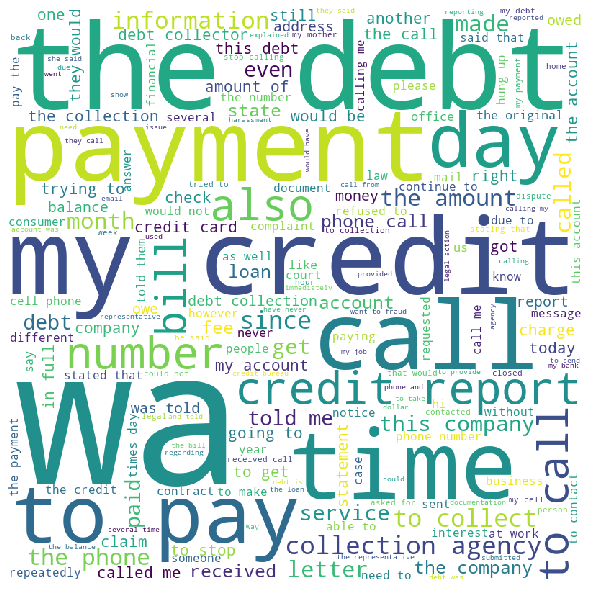

Cluster number: 34
hello this is a bit different i keep receiving calls from on multiple occasions in regards to a payday loan that i received and paid off in from which cashnet usa is apart of they are stating that the original loan was done on in which according to cashnet usa s site is which was paid off on it is strange on how the loan was paid off more than years ago and where they sent the information was to an address that i have n t resided in almost years so i was never notified i contacted the original creditor with is cashnet usa and was advised that the loan was paid off and it is a possible scam i advised of the company but they are unable to keep up with the companies that are performing the scams is trying to resolve a debt for and have been hanging up on me and not allowing me to dispute the claim which i can process bank statements that the loan was paid in full so i am not sure what else to do at this point they provided me with a claim number of and spoke with and a 

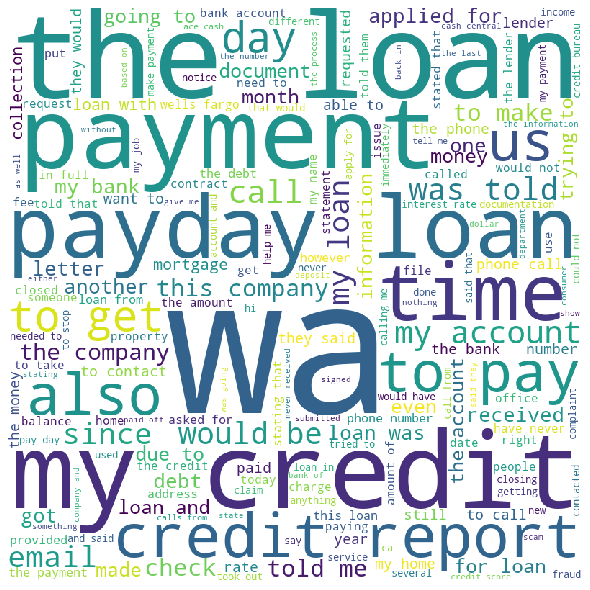

Cluster number: 35
i opened a bank account with citi bank under a promotion which promised me thank you points when i open a new citigold bank account the promotion indicated that i need to be a new account holder and since i had recently closed a bank account i talked to the agent to enquire whether i qualify for this promotion or not at that time the agent told me that i qualify and i will get the points within days from opening the account so i went ahead and opened the account after using the account for a month i verified with the bank if i have met all requirements of the promotion and when i will receive the points the bank responded via email that i have met all requirements and will receive the points no later than by statement now after passed and i did not receive the points i inquired again and this time they tell me that i do not qualify since i used to be a customer at a earlier point in time before i opened this bank account this is a very unfair and deceptive i inquired

Number of entries: 1013


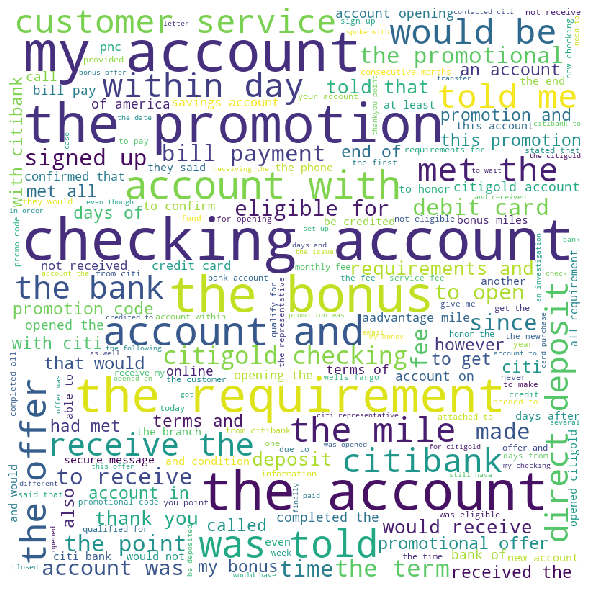

Cluster number: 36
i get an inquiries from report with transunion who was reported twice i need the inquiries to be removed from my credit report 

i have been disputing with experian for over years for inaccurate reports and fraudulent reports and loans that was deleted then put back on and i have fraud alert with security freeze with my number some one changed my fraud alert phone number and put there number in there mines was removed and i have sent out numerous stuff too experian will not follow the fcra are the fdcpa they want proof i sent proof times they still allow it too happen i need help please i have good credit know its been destroyed equifax would n t send me credit report for months and transunion want remove the fraudulent inquires that s why hade fraud alert think on called me yes called said my fraud alert phone number hade been tampered with did n t match from fraud alert number supposed too be been like that since know its got number showing up as its not me i have 

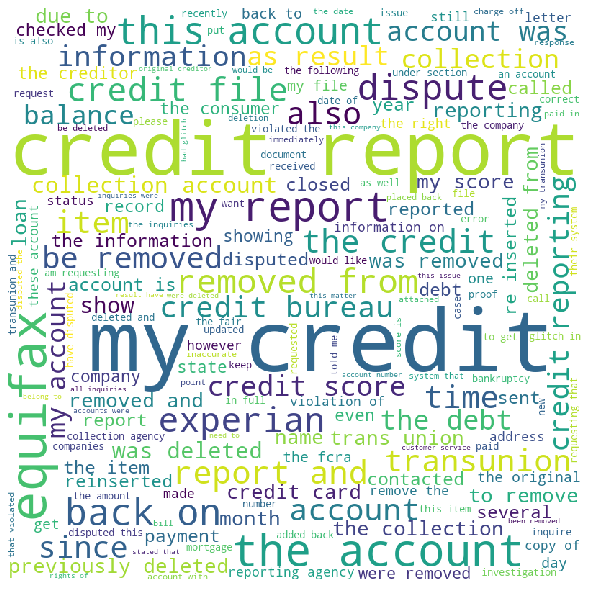

Cluster number: 37
i have been working with chase bank since in procuring a new mortgage for my home my mortgage is currently with my closing was targeted for and the loan amount is it is now and they continue to delay a yes or no answer to me in regards to the mortgage in addition they continue to contact for payoff balances at a cost of each time and my total due now is they continue to advise they escalating the mortgage to their manager which takes days vs one week underwriters however i do not receive a response other than people are business and they can not push their underwriters i have sent numerous emails to chase asking for the status on a yes or no answer and they continue to provide a run around and continue to give me excuses which does not calculate to the real reason all i am requesting is a yes or no answer i do feel banks as chase give banks a bad name and adds to the reason why customers do not trust banks 

in filed a mortgage foreclosure action in the circuit court

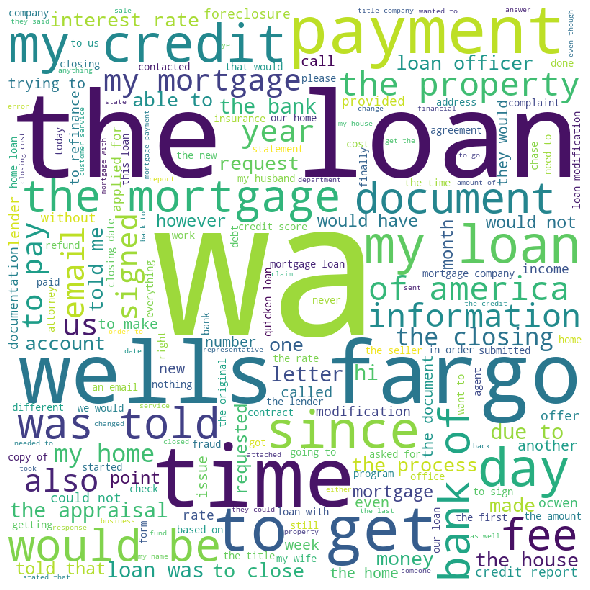

In [12]:
from wordcloud import WordCloud
import nltk
from nltk.corpus import stopwords
import random

#if it's your first time running with these stopwords, run the following line aswell:
#nltk.download('stopwords')

stopwords = set(stopwords.words('english'))
stopwords.add('xx')

for i in range(0,number_clusters):
    all_words = ''
    print('Cluster number: '+str(i))
    amount = 0
    for index, row in df_result.iterrows():
        if row[0] == i:
            all_words += ' ' + row['Consumer complaint narrative']
            rand = random.randint(1,200)
            amount += 1
            if(rand == 1):
                print(row['Consumer complaint narrative'] + '\n')
    wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', 
                stopwords = stopwords, 
                min_font_size = 10).generate(all_words) 
    print('Number of entries: ' + str(amount))
    plt.figure(figsize = (8, 8), facecolor = None) 
    plt.imshow(wordcloud) 
    plt.axis("off") 
    plt.tight_layout(pad = 0) 
    plt.show() 
